# Задача проекта

Чтобы оптимизировать производственные расходы, металлургический комбинат решил уменьшить потребление электроэнергии на этапе обработки стали. Вам предстоит построить модель, которая предскажет температуру стали.

### Описание этапа обработки

Сталь обрабатывают в металлическом ковше вместимостью около 100 тонн. Чтобы ковш выдерживал высокие температуры, изнутри его облицовывают огнеупорным кирпичом. Расплавленную сталь заливают в ковш и подогревают до нужной температуры графитовыми электродами. Они установлены в крышке ковша. 

Из сплава выводится сера (десульфурация), добавлением примесей корректируется химический состав и отбираются пробы. Сталь легируют — изменяют её состав — подавая куски сплава из бункера для сыпучих материалов или проволоку через специальный трайб-аппарат (англ. tribe, «масса»).

Перед тем как первый раз ввести легирующие добавки, измеряют температуру стали и производят её химический анализ. Потом температуру на несколько минут повышают, добавляют легирующие материалы и продувают сплав инертным газом. Затем его перемешивают и снова проводят измерения. Такой цикл повторяется до достижения целевого химического состава и оптимальной температуры плавки.

Тогда расплавленная сталь отправляется на доводку металла или поступает в машину непрерывной разливки. Оттуда готовый продукт выходит в виде заготовок-слябов (англ. *slab*, «плита»).

### Описание данных

Данные состоят из файлов, полученных из разных источников:

- `data_arc.csv` — данные об электродах;
- `data_bulk.csv` — данные о подаче сыпучих материалов (объём);
- `data_bulk_time.csv` *—* данные о подаче сыпучих материалов (время);
- `data_gas.csv` — данные о продувке сплава газом;
- `data_temp.csv` — результаты измерения температуры;
- `data_wire.csv` — данные о проволочных материалах (объём);
- `data_wire_time.csv` — данные о проволочных материалах (время).

Во всех файлах столбец `key` содержит номер партии. В файлах может быть несколько строк с одинаковым значением `key`: они соответствуют разным итерациям обработки.

# Загрузка данных, первичный анализ

In [1]:
#Импорты сторонних библиотек
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

#Импорты отдельных модулей
from sklearn.model_selection import (
    train_test_split,
    GridSearchCV,
    RandomizedSearchCV)
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import (
    Lasso,
    Ridge,
    ElasticNet)
from sklearn.ensemble import RandomForestRegressor
from sklearn.decomposition import PCA
from sklearn.metrics import mean_absolute_error
from catboost import CatBoostRegressor, Pool, cv

RANDOM_STATE = 130323

In [2]:
try:
    data_arc = pd.read_csv('data_arc.csv')
    data_bulk = pd.read_csv('data_bulk.csv')
    data_bulk_time = pd.read_csv('data_bulk_time.csv')
    data_gas = pd.read_csv('data_gas.csv')
    data_temp = pd.read_csv('data_temp.csv')
    data_wire = pd.read_csv('data_wire.csv')
    data_wire_time = pd.read_csv('data_wire_time.csv')
except:
    data_arc = pd.read_csv('/datasets/final_steel/data_arc.csv')
    data_bulk = pd.read_csv('/datasets/final_steel/data_bulk.csv')
    data_bulk_time = pd.read_csv('/datasets/final_steel/data_bulk_time.csv')
    data_gas = pd.read_csv('/datasets/final_steel/data_gas.csv')
    data_temp = pd.read_csv('/datasets/final_steel/data_temp.csv')
    data_wire = pd.read_csv('/datasets/final_steel/data_wire.csv')
    data_wire_time = pd.read_csv('/datasets/final_steel/data_wire_time.csv')

## Датасет с данными об электродах

In [3]:
data_arc.head()

,key,Начало нагрева дугой,Конец нагрева дугой,Активная мощность,Реактивная мощность
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.976059,0.687084
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.805607,0.520285
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.744363,0.498805
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,1.659363,1.062669
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.692755,0.414397


In [4]:
# Приведем колонки к латинице
data_arc.columns = ['key', 'start_heating', 'finish_heating', 'active_power', 'reactive_power']

In [5]:
data_arc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14876 entries, 0 to 14875
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   key             14876 non-null  int64  
 1   start_heating   14876 non-null  object 
 2   finish_heating  14876 non-null  object 
 3   active_power    14876 non-null  float64
 4   reactive_power  14876 non-null  float64
dtypes: float64(2), int64(1), object(2)
memory usage: 581.2+ KB


In [6]:
data_arc['start_heating'] = pd.to_datetime(data_arc['start_heating'], format='%Y-%m-%d %H:%M:%S')
data_arc['finish_heating'] = pd.to_datetime(data_arc['finish_heating'], format='%Y-%m-%d %H:%M:%S')
data_arc['duration_in_seconds'] = (data_arc['finish_heating'] - data_arc['start_heating']).dt.seconds

Пропусков в данных нет

In [7]:
data_arc.describe()

,key,active_power,reactive_power,duration_in_seconds
count,14876.000000,14876.000000,14876.000000,14876.000000
mean,1615.220422,0.670441,0.452592,171.670946
std,934.571502,0.408159,5.878702,98.186803
min,1.000000,0.030002,-715.504924,11.000000
25%,806.000000,0.395297,0.290991,107.000000
50%,1617.000000,0.555517,0.415962,147.000000
75%,2429.000000,0.857034,0.637371,214.000000
max,3241.000000,3.731596,2.676388,907.000000


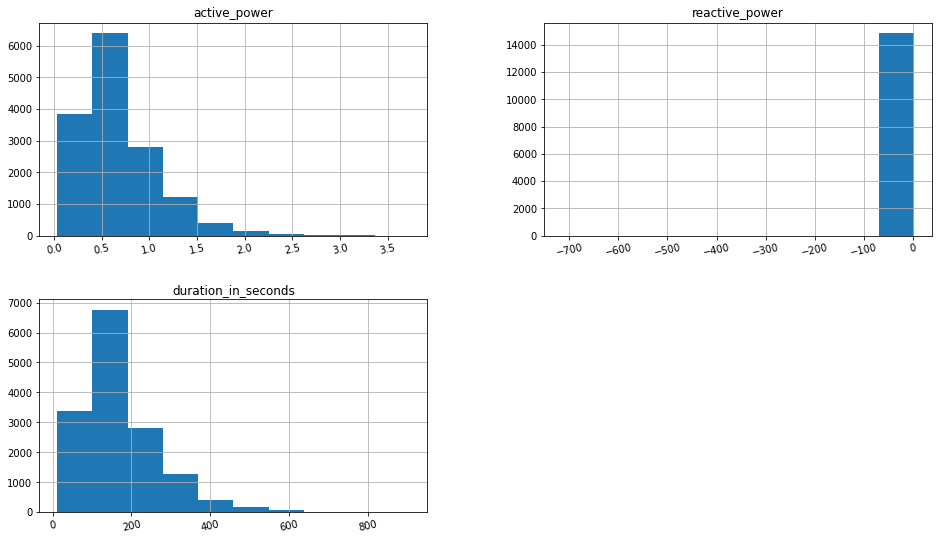

In [8]:
data_arc.drop(['key', 'start_heating', 'finish_heating'], axis=1).hist(figsize=(16, 9), xrot=12);

Наблюдается аномальные значения в признаке Реактивная мощность, проверим отрицательные значения

In [9]:
data_arc.query('reactive_power < 0')

,key,start_heating,finish_heating,active_power,reactive_power,duration_in_seconds
9780,2116,2019-07-24 00:44:48,2019-07-24 00:46:37,0.495782,-715.504924,109


In [10]:
data_arc.loc[(data_arc['active_power'] > 0.495) & (data_arc['active_power'] < 0.496)\
             & (data_arc['duration_in_seconds'] > 105) & (data_arc['duration_in_seconds'] < 114)]

,key,start_heating,finish_heating,active_power,reactive_power,duration_in_seconds
1742,375,2019-05-17 13:26:06,2019-05-17 13:27:57,0.495823,0.300950,111
9780,2116,2019-07-24 00:44:48,2019-07-24 00:46:37,0.495782,-715.504924,109
12979,2821,2019-08-17 19:36:11,2019-08-17 19:37:59,0.495524,0.352547,108
14267,3101,2019-08-27 16:14:34,2019-08-27 16:16:26,0.495548,0.326059,112


Т.к. аномальное значение всего одно, заменим выброс на похожее значения по активной мощности

In [11]:
data_arc.loc[9780, 'reactive_power'] = data_arc.loc[12979, 'reactive_power']

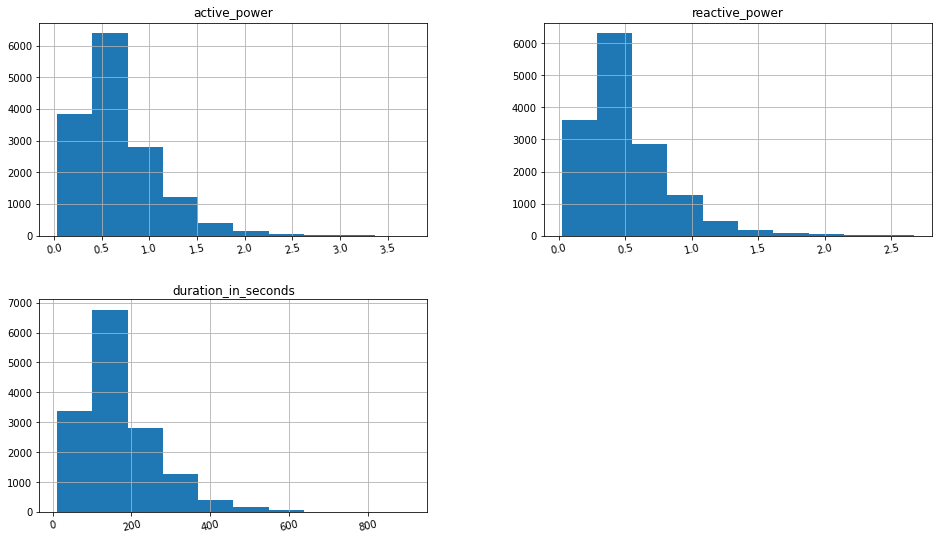

In [12]:
data_arc.drop(['key', 'start_heating', 'finish_heating'], axis=1).hist(figsize=(16, 9), xrot=12);

Гистограмма приняла вид адекватного распределения, на этом предобработку данной таблицы можно завершить  

In [13]:
data_arc['full_power'] = (data_arc['active_power'] ** 2 + data_arc['reactive_power'] ** 2) ** 0.5
data_arc['work'] = data_arc['full_power'] * data_arc['duration_in_seconds']

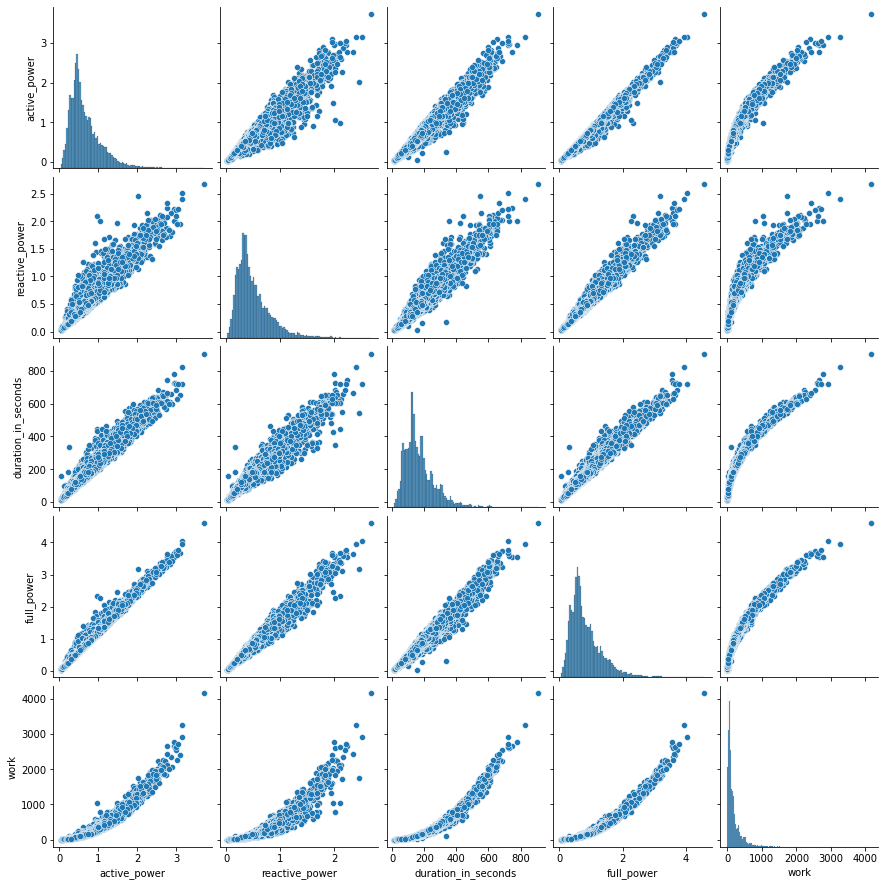

In [14]:
sns.pairplot(data_arc.drop('key', axis=1));

Ожидаемо, наблюдается сильная корреляция между всеми признаками. В финальном датасете избавимся от активной и реактивной мощности, будем пользоваться только полной. Также, необходимо оценить корреляцию между полной мощностью и временем нагрева. Если коэффициент не более 0.95 - данный признак также добавим в финальную таблицу.
Также, имеет смысл ввести новый признак с количеством итераций нагрева по партиям, т.к. он напрямую влияет на энергопотребление

In [15]:
if data_arc['full_power'].corr(data_arc['duration_in_seconds']) > 0.95:
    print('Коэффициент корреляции между полной мощностью и длительностью нагрева указывает на очень сильную зависимость,\
    близкой к линейной. Признак "длительность нагрева в секундах" в финальный датасет не попадает')
else:
    print('Коэффициент корреляции между полной мощностью и длительностью нагрева не превосходит  верхнего предела,\
    слишком сильной линейной зависимости не наблюдается, можно попробовать ввести данный признак в модель.')
        

Коэффициент корреляции между полной мощностью и длительностью нагрева указывает на очень сильную зависимость,    близкой к линейной. Признак "длительность нагрева в секундах" в финальный датасет не попадает


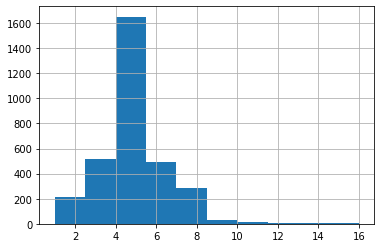

In [16]:
#Количество итераций нагрева по партиям
data_heating_iterations = data_arc.groupby('key')['key'].count()
data_heating_iterations.rename('heating_iterations', inplace=True)
data_heating_iterations.hist();

## Датасеты с объемами использованных сыпучих материалов и временем подачи

In [17]:
data_bulk.head()

,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,NaN,NaN,NaN,43.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,206.0,NaN,150.0,154.0
1,2,NaN,NaN,NaN,73.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,206.0,NaN,149.0,154.0
2,3,NaN,NaN,NaN,34.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,205.0,NaN,152.0,153.0
3,4,NaN,NaN,NaN,81.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,207.0,NaN,153.0,154.0
4,5,NaN,NaN,NaN,78.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,203.0,NaN,151.0,152.0


In [18]:
#data.columns = [name.lower() for name in data.columns]
data_bulk.columns = data_bulk.columns.str.replace(' ', '_')
data_bulk.columns = data_bulk.columns.str.lower()

In [19]:
#Добавим признак, в котором будет указано, сколько раз добавлялись сыпучие материалы
data_bulk['bulk_qty'] = data_bulk.drop('key', axis=1).count(axis=1)

In [20]:
data_bulk.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 17 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   key       3129 non-null   int64  
 1   bulk_1    252 non-null    float64
 2   bulk_2    22 non-null     float64
 3   bulk_3    1298 non-null   float64
 4   bulk_4    1014 non-null   float64
 5   bulk_5    77 non-null     float64
 6   bulk_6    576 non-null    float64
 7   bulk_7    25 non-null     float64
 8   bulk_8    1 non-null      float64
 9   bulk_9    19 non-null     float64
 10  bulk_10   176 non-null    float64
 11  bulk_11   177 non-null    float64
 12  bulk_12   2450 non-null   float64
 13  bulk_13   18 non-null     float64
 14  bulk_14   2806 non-null   float64
 15  bulk_15   2248 non-null   float64
 16  bulk_qty  3129 non-null   int64  
dtypes: float64(15), int64(2)
memory usage: 415.7 KB


In [21]:
data_bulk.describe()

,key,bulk_1,bulk_2,bulk_3,bulk_4,bulk_5,bulk_6,bulk_7,bulk_8,bulk_9,bulk_10,bulk_11,bulk_12,bulk_13,bulk_14,bulk_15,bulk_qty
count,3129.000000,252.000000,22.000000,1298.000000,1014.000000,77.000000,576.000000,25.000000,1.0,19.000000,176.000000,177.000000,2450.000000,18.000000,2806.000000,2248.000000,3129.000000
mean,1624.383509,39.242063,253.045455,113.879045,104.394477,107.025974,118.925347,305.600000,49.0,76.315789,83.284091,76.819209,260.471020,181.111111,170.284747,160.513345,3.566315
std,933.337642,18.277654,21.180578,75.483494,48.184126,81.790646,72.057776,191.022904,NaN,21.720581,26.060347,59.655365,120.649269,46.088009,65.868652,51.765319,1.216165
min,1.000000,10.000000,228.000000,6.000000,12.000000,11.000000,17.000000,47.000000,49.0,63.000000,24.000000,8.000000,53.000000,151.000000,16.000000,1.000000,1.000000
25%,816.000000,27.000000,242.000000,58.000000,72.000000,70.000000,69.750000,155.000000,49.0,66.000000,64.000000,25.000000,204.000000,153.250000,119.000000,105.000000,3.000000
50%,1622.000000,31.000000,251.500000,97.500000,102.000000,86.000000,100.000000,298.000000,49.0,68.000000,86.500000,64.000000,208.000000,155.500000,151.000000,160.000000,4.000000
75%,2431.000000,46.000000,257.750000,152.000000,133.000000,132.000000,157.000000,406.000000,49.0,70.500000,102.000000,106.000000,316.000000,203.500000,205.750000,205.000000,4.000000
max,3241.000000,185.000000,325.000000,454.000000,281.000000,603.000000,503.000000,772.000000,49.0,147.000000,159.000000,313.000000,1849.000000,305.000000,636.000000,405.000000,7.000000


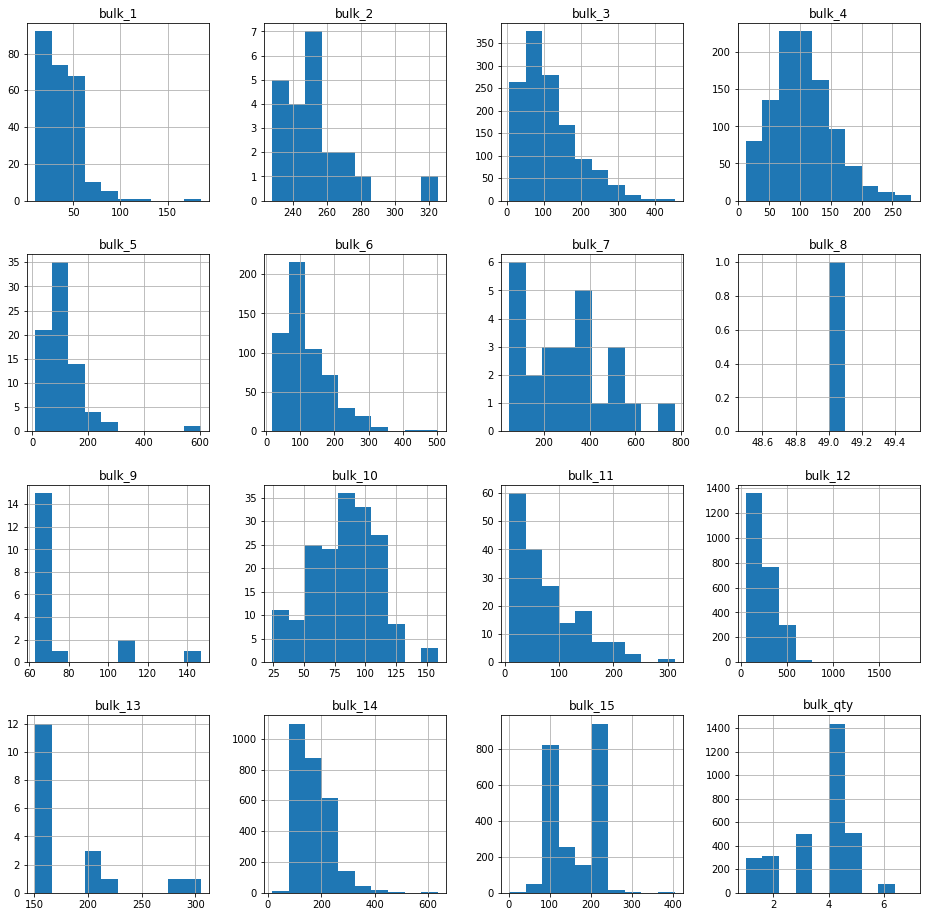

In [22]:
data_bulk.drop('key', axis=1).hist(figsize=(16, 16));

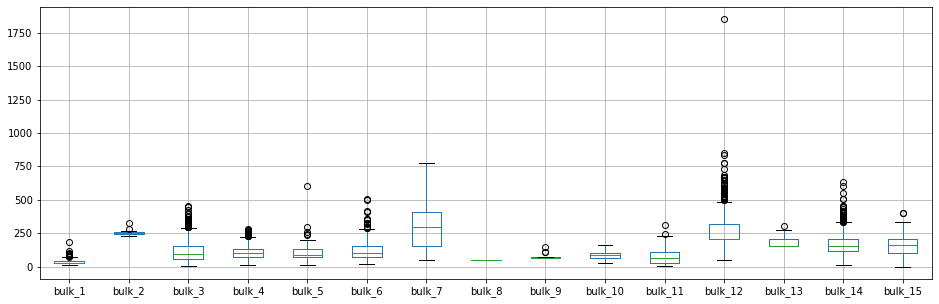

In [23]:
data_bulk.drop(['key', 'bulk_qty'], axis=1).boxplot(figsize=(16, 5));

<div class="alert alert-block alert-info">
<b>Пометка:</b> Данные об объемах сыпучих материалов выглядят нормально; присутствуют лишь пара значений в bulk_5 и bulk_12, которые резко выделяются на фоне остальных, необходимо уточнение: ошибка или реально возможное значение</div>

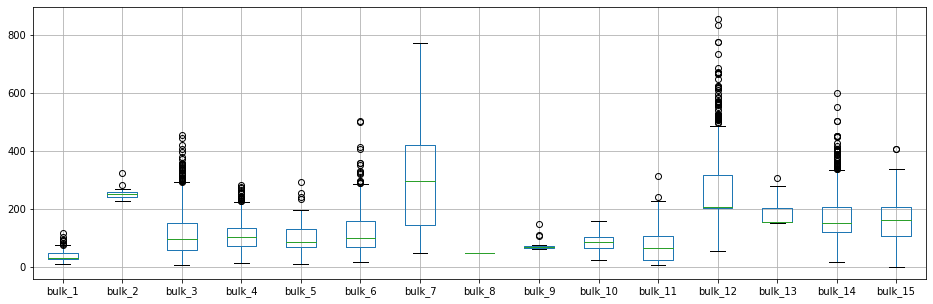

In [24]:
#Удалим пару самых резких аномальных значений
data_bulk = data_bulk.loc[(data_bulk['bulk_5'] < 500) | (data_bulk['bulk_5'] != data_bulk['bulk_5'])]
data_bulk = data_bulk.loc[(data_bulk['bulk_12'] < 1750) | (data_bulk['bulk_12'] != data_bulk['bulk_12'])]
data_bulk.drop(['key', 'bulk_qty'], axis=1).boxplot(figsize=(16, 5));

In [25]:
data_bulk_time.head()

,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,NaN,NaN,NaN,2019-05-03 11:21:30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 11:03:52,NaN,2019-05-03 11:03:52,2019-05-03 11:03:52
1,2,NaN,NaN,NaN,2019-05-03 11:46:38,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 11:40:20,NaN,2019-05-03 11:40:20,2019-05-03 11:40:20
2,3,NaN,NaN,NaN,2019-05-03 12:31:06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 12:09:40,NaN,2019-05-03 12:09:40,2019-05-03 12:09:40
3,4,NaN,NaN,NaN,2019-05-03 12:48:43,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 12:41:24,NaN,2019-05-03 12:41:24,2019-05-03 12:41:24
4,5,NaN,NaN,NaN,2019-05-03 13:18:50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 13:12:56,NaN,2019-05-03 13:12:56,2019-05-03 13:12:56


In [26]:
data_bulk_time['bulk_qty'] = data_bulk_time.drop('key', axis=1).count(axis=1)

In [27]:
data_bulk_time.columns = data_bulk.columns.str.replace(' ', '_')
data_bulk_time.columns = data_bulk.columns.str.lower()

In [28]:
def data_bulk_to_hours(data, num_of_bulks):
    for i in range(1, num_of_bulks + 1):
        col_name = 'bulk_' + str(i)
        data[col_name] = pd.to_datetime(data[col_name], format='%Y-%m-%d %H:%M:%S', errors='ignore')
        data[col_name] = data[col_name].dt.hour
        
def data_bulk_to_months(data, num_of_bulks):
    for i in range(1, num_of_bulks + 1):
        col_name = 'bulk_' + str(i)
        data[col_name] = pd.to_datetime(data[col_name], format='%Y-%m-%d %H:%M:%S', errors='ignore')
        data[col_name] = data[col_name].dt.month

In [29]:
data_bulk_time.head()

,key,bulk_1,bulk_2,bulk_3,bulk_4,bulk_5,bulk_6,bulk_7,bulk_8,bulk_9,bulk_10,bulk_11,bulk_12,bulk_13,bulk_14,bulk_15,bulk_qty
0,1,NaN,NaN,NaN,2019-05-03 11:21:30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 11:03:52,NaN,2019-05-03 11:03:52,2019-05-03 11:03:52,4
1,2,NaN,NaN,NaN,2019-05-03 11:46:38,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 11:40:20,NaN,2019-05-03 11:40:20,2019-05-03 11:40:20,4
2,3,NaN,NaN,NaN,2019-05-03 12:31:06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 12:09:40,NaN,2019-05-03 12:09:40,2019-05-03 12:09:40,4
3,4,NaN,NaN,NaN,2019-05-03 12:48:43,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 12:41:24,NaN,2019-05-03 12:41:24,2019-05-03 12:41:24,4
4,5,NaN,NaN,NaN,2019-05-03 13:18:50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 13:12:56,NaN,2019-05-03 13:12:56,2019-05-03 13:12:56,4


In [30]:
data_bulk_time.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 17 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   key       3129 non-null   int64 
 1   bulk_1    252 non-null    object
 2   bulk_2    22 non-null     object
 3   bulk_3    1298 non-null   object
 4   bulk_4    1014 non-null   object
 5   bulk_5    77 non-null     object
 6   bulk_6    576 non-null    object
 7   bulk_7    25 non-null     object
 8   bulk_8    1 non-null      object
 9   bulk_9    19 non-null     object
 10  bulk_10   176 non-null    object
 11  bulk_11   177 non-null    object
 12  bulk_12   2450 non-null   object
 13  bulk_13   18 non-null     object
 14  bulk_14   2806 non-null   object
 15  bulk_15   2248 non-null   object
 16  bulk_qty  3129 non-null   int64 
dtypes: int64(2), object(15)
memory usage: 415.7+ KB


In [31]:
data_bulk_time_hours = data_bulk_time.copy()
data_bulk_to_hours(data_bulk_time_hours, 15)
data_bulk_time_months = data_bulk_time.copy()
data_bulk_to_months(data_bulk_time_months, 15)

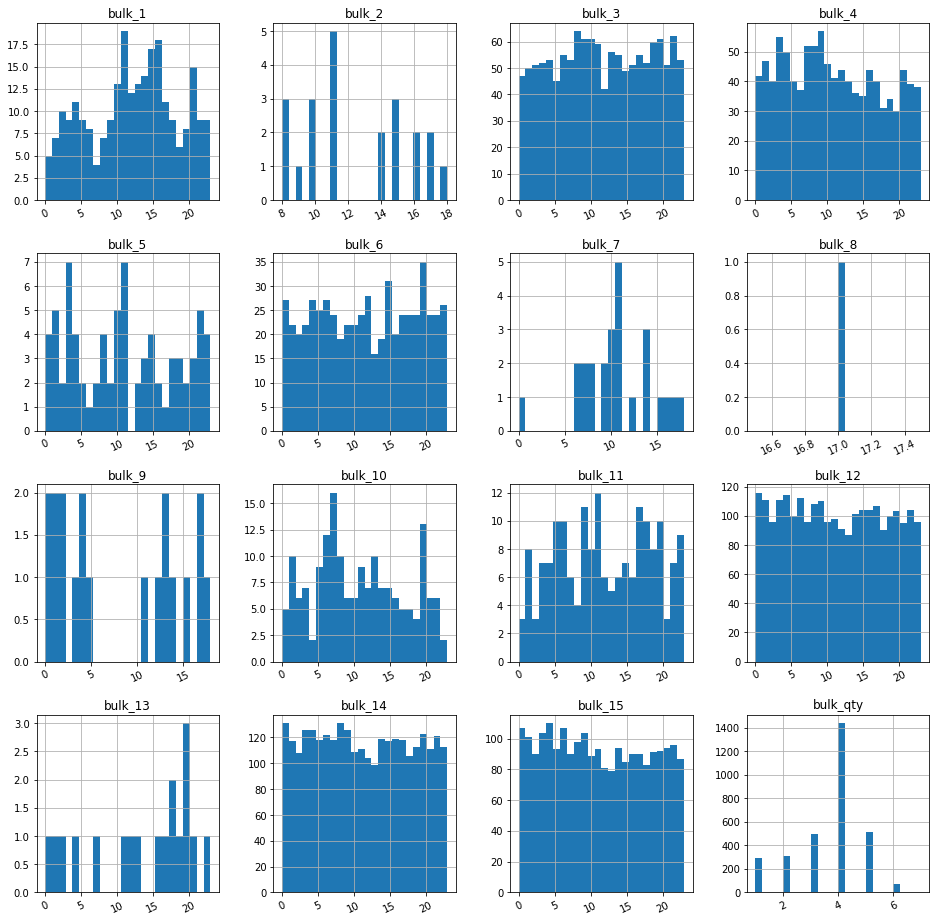

In [32]:
data_bulk_time_hours.drop('key', axis=1).hist(figsize=(16, 16), xrot=25, bins=24);

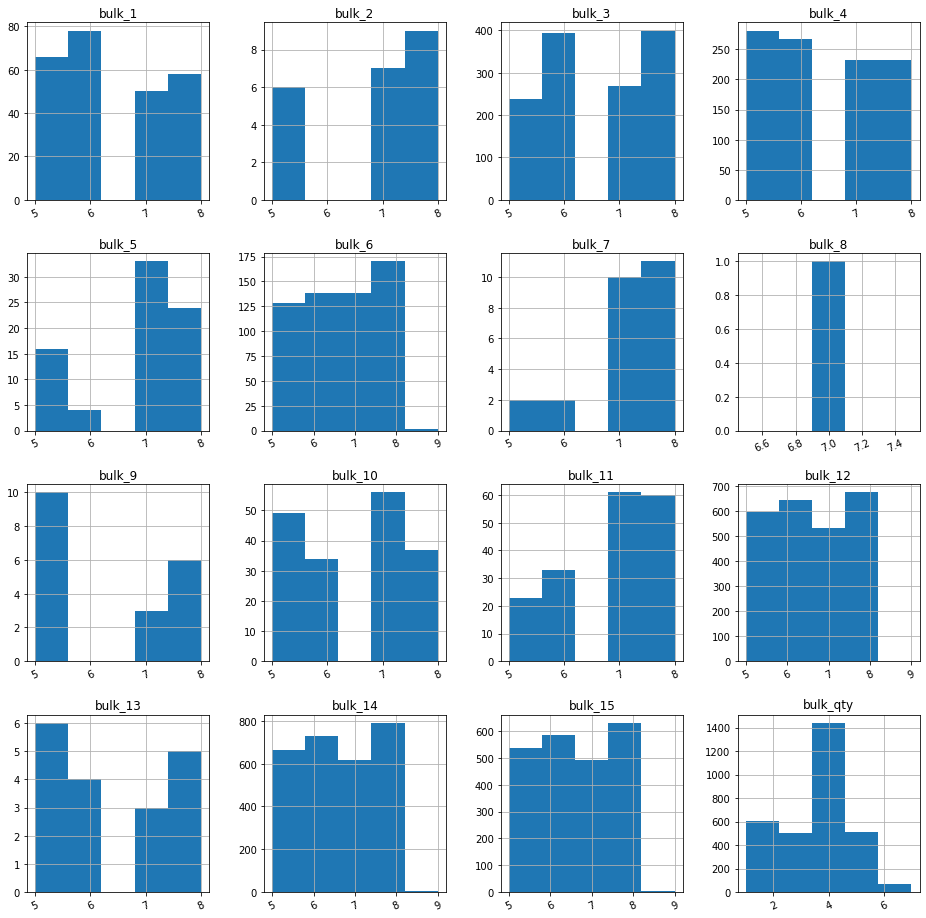

In [33]:
data_bulk_time_months.drop('key', axis=1).hist(figsize=(16, 16), xrot=25, bins=5);

In [34]:
bulks = []
for i in range(1, 16):
        col_name = 'bulk_' + str(i)
        bulks.append(col_name)

In [35]:
data_bulk_time_hours['daytime'] = data_bulk_time_hours.drop(['key', 'bulk_qty'], axis=1).median(axis=1)
data_bulk_time_months['month'] = data_bulk_time_months.drop(['key', 'bulk_qty'], axis=1).median(axis=1)

В целом видно, что производство проходит безостановочно 24 часа в сутки.
Однако некоторые бункеры для подачи сыпучих материалов используются гораздо меньше чем остальные. Возможно, если оптимизировать процесс - можно подавать материалы быстрее, что снижает время остывание стали, а значит сокращает время последующего нагрева. В финальный датасет попробуем ввести пару новых признаков: час дня и номер месяца, т.к. температура окружающей среды может оказывать незначительное, но влияние на нагрев и остывание сплава.

In [36]:
#Проверяем, что количества добавлений соответствют в обеих таблицах
(data_bulk['bulk_qty'] - data_bulk_time['bulk_qty']).unique()

array([ 0., nan])

## Данные о продувке газом

In [37]:
data_gas.head()

,key,Газ 1
0,1,29.749986
1,2,12.555561
2,3,28.554793
3,4,18.841219
4,5,5.413692


In [38]:
data_gas.columns = ['key', 'gas']

In [39]:
#Каждому key соответствует одна продувка газом
data_gas.groupby('key')['key'].count().unique()

array([1])

In [40]:
data_gas.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3239 entries, 0 to 3238
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   key     3239 non-null   int64  
 1   gas     3239 non-null   float64
dtypes: float64(1), int64(1)
memory usage: 50.7 KB


In [41]:
data_gas.describe()

,key,gas
count,3239.000000,3239.000000
mean,1621.861377,11.002062
std,935.386334,6.220327
min,1.000000,0.008399
25%,812.500000,7.043089
50%,1622.000000,9.836267
75%,2431.500000,13.769915
max,3241.000000,77.995040


array([[<AxesSubplot:title={'center':'gas'}>]], dtype=object)

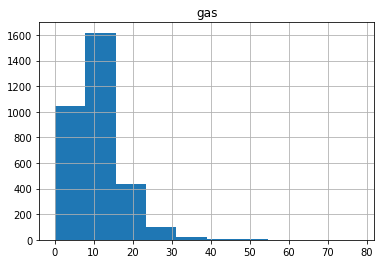

In [42]:
data_gas.drop('key', axis=1).hist()

## Данные о температуре и времени замеров

Целевым признаком является температуры розлива стали после проведения всех этапов подготовки (легирование, продувка газом и т.д.) и достижения сталью нужного химсостава. 
При обнаружении в данных пропуска целевой температуры - весь объект (ковш) подлежит удалению из финального датасета.
Также, температура при розливе не может быть менее 1400 градусов, также подлежит удалению.

In [43]:
data_temp

,key,Время замера,Температура
0,1,2019-05-03 11:16:18,1571.0
1,1,2019-05-03 11:25:53,1604.0
2,1,2019-05-03 11:29:11,1618.0
3,1,2019-05-03 11:30:01,1601.0
4,1,2019-05-03 11:30:39,1613.0
...,...,...,...
15902,3241,2019-09-01 04:03:30,1586.0
15903,3241,2019-09-01 04:16:12,NaN
15904,3241,2019-09-01 04:22:39,NaN
15905,3241,2019-09-01 04:33:42,NaN


In [44]:
data_temp.columns = ['key', 'timestamp', 'temperature']

In [45]:
data_temp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15907 entries, 0 to 15906
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   key          15907 non-null  int64  
 1   timestamp    15907 non-null  object 
 2   temperature  13006 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 372.9+ KB


In [46]:
data_temp[data_temp['temperature'].isna()]['key'].unique()

array([2500, 2501, 2502, 2503, 2504, 2505, 2506, 2507, 2508, 2509, 2510,
       2511, 2512, 2513, 2514, 2515, 2516, 2517, 2518, 2519, 2520, 2521,
       2522, 2523, 2524, 2525, 2526, 2527, 2528, 2529, 2530, 2531, 2532,
       2533, 2534, 2535, 2536, 2537, 2538, 2539, 2540, 2541, 2542, 2543,
       2544, 2545, 2546, 2547, 2548, 2549, 2550, 2551, 2552, 2553, 2554,
       2555, 2556, 2557, 2558, 2559, 2560, 2561, 2562, 2563, 2564, 2565,
       2566, 2567, 2568, 2569, 2570, 2571, 2572, 2573, 2574, 2575, 2576,
       2577, 2578, 2579, 2580, 2581, 2582, 2583, 2584, 2585, 2586, 2587,
       2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598,
       2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609,
       2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620,
       2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631,
       2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642,
       2643, 2644, 2645, 2646, 2647, 2648, 2649, 26

In [47]:
# Заменим пропуски на -1, отсортируем по столбцам с ключом и временем. В случае, если последнее значение температуры по
# ковшу будет равно -1 - удаляем весь объект.
data_temp.fillna(-1, inplace=True)
data_temp.sort_values(by=['key', 'timestamp'])
data_temp

,key,timestamp,temperature
0,1,2019-05-03 11:16:18,1571.0
1,1,2019-05-03 11:25:53,1604.0
2,1,2019-05-03 11:29:11,1618.0
3,1,2019-05-03 11:30:01,1601.0
4,1,2019-05-03 11:30:39,1613.0
...,...,...,...
15902,3241,2019-09-01 04:03:30,1586.0
15903,3241,2019-09-01 04:16:12,-1.0
15904,3241,2019-09-01 04:22:39,-1.0
15905,3241,2019-09-01 04:33:42,-1.0


In [48]:
data_temp_start = data_temp.groupby('key', dropna=False)[['timestamp','temperature']].first().reset_index()
data_temp_start = data_temp_start.loc[(data_temp_start['temperature'] > 1400)]
data_temp_start.columns = ['key', 'timestamp', 'start_temperature']
data_temp_start

,key,timestamp,start_temperature
0,1,2019-05-03 11:16:18,1571.0
1,2,2019-05-03 11:37:27,1581.0
2,3,2019-05-03 12:13:17,1596.0
3,4,2019-05-03 12:52:57,1601.0
4,5,2019-05-03 13:23:19,1576.0
...,...,...,...
3211,3237,2019-08-31 22:44:04,1569.0
3212,3238,2019-08-31 23:30:31,1584.0
3213,3239,2019-09-01 01:31:47,1598.0
3214,3240,2019-09-01 02:39:01,1617.0


In [49]:
data_temp_final = data_temp.groupby('key', dropna=False)[['timestamp','temperature']].last().reset_index()
data_temp_final = data_temp_final.loc[(data_temp_final['temperature'] > 1400)]
data_temp_final.columns = ['key', 'timestamp', 'final_temperature']
data_temp_final

,key,timestamp,final_temperature
0,1,2019-05-03 11:30:39,1613.0
1,2,2019-05-03 11:59:12,1602.0
2,3,2019-05-03 12:34:57,1599.0
3,4,2019-05-03 12:59:25,1625.0
4,5,2019-05-03 13:36:01,1602.0
...,...,...,...
2472,2495,2019-08-06 00:54:42,1591.0
2473,2496,2019-08-06 01:29:52,1591.0
2474,2497,2019-08-06 01:53:50,1589.0
2475,2498,2019-08-06 02:25:31,1594.0


In [50]:
data_temp_final['timestamp'] = pd.to_datetime(data_temp['timestamp'], format = '%Y-%m-%d %H:%M:%S')

In [51]:
data_temp_final.describe()

,key,final_temperature
count,2477.000000,2477.000000
mean,1249.968510,1595.334275
std,720.073717,16.019339
min,1.000000,1541.000000
25%,628.000000,1587.000000
50%,1251.000000,1593.000000
75%,1872.000000,1599.000000
max,2499.000000,1700.000000


array([[<AxesSubplot:title={'center':'final_temperature'}>]], dtype=object)

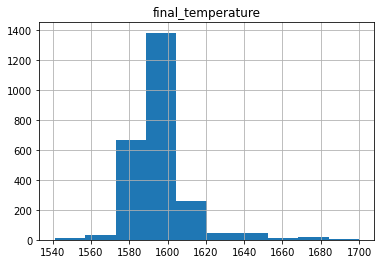

In [52]:
data_temp_final.drop(['key', 'timestamp'], axis=1).hist()

<AxesSubplot:>

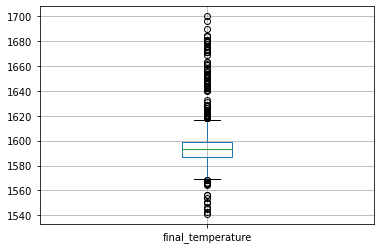

In [53]:
data_temp_final.drop(['key', 'timestamp'], axis=1).boxplot()

<AxesSubplot:>

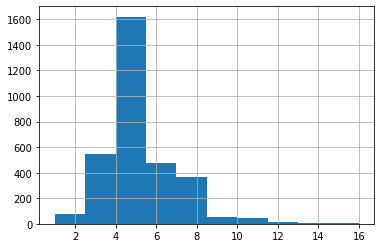

In [54]:
#Таблица с данными о количестве замеров
data_measurements_qty = data_temp.groupby('key')['key'].count()
data_measurements_qty.rename('measurements_qty', inplace=True)
data_measurements_qty.hist()

## Данные об объемах подачи проволочных материалов и времени

In [55]:
data_wire.head()

,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
0,1,60.059998,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,96.052315,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,91.160157,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,89.063515,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,89.238236,9.11456,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [56]:
data_wire.columns = data_wire.columns.str.replace(' ', '_')
data_wire.columns = data_wire.columns.str.lower()

In [57]:
data_wire['wires_qty'] = data_wire.drop('key', axis=1).count(axis=1)

In [58]:
data_wire.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3081 entries, 0 to 3080
Data columns (total 11 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   key        3081 non-null   int64  
 1   wire_1     3055 non-null   float64
 2   wire_2     1079 non-null   float64
 3   wire_3     63 non-null     float64
 4   wire_4     14 non-null     float64
 5   wire_5     1 non-null      float64
 6   wire_6     73 non-null     float64
 7   wire_7     11 non-null     float64
 8   wire_8     19 non-null     float64
 9   wire_9     29 non-null     float64
 10  wires_qty  3081 non-null   int64  
dtypes: float64(9), int64(2)
memory usage: 264.9 KB


In [59]:
data_wire.describe()

,key,wire_1,wire_2,wire_3,wire_4,wire_5,wire_6,wire_7,wire_8,wire_9,wires_qty
count,3081.000000,3055.000000,1079.000000,63.000000,14.000000,1.000,73.000000,11.000000,19.000000,29.000000,3081.000000
mean,1623.426485,100.895853,50.577323,189.482681,57.442841,15.132,48.016974,10.039007,53.625193,34.155752,1.409932
std,932.996726,42.012518,39.320216,99.513444,28.824667,NaN,33.919845,8.610584,16.881728,19.931616,0.578078
min,1.000000,1.918800,0.030160,0.144144,24.148801,15.132,0.034320,0.234208,45.076721,4.622800,1.000000
25%,823.000000,72.115684,20.193680,95.135044,40.807002,15.132,25.053600,6.762756,46.094879,22.058401,1.000000
50%,1619.000000,100.158234,40.142956,235.194977,45.234282,15.132,42.076324,9.017009,46.279999,30.066399,1.000000
75%,2434.000000,126.060483,70.227558,276.252014,76.124619,15.132,64.212723,11.886057,48.089603,43.862003,2.000000
max,3241.000000,330.314424,282.780152,385.008668,113.231044,15.132,180.454575,32.847674,102.762401,90.053604,5.000000


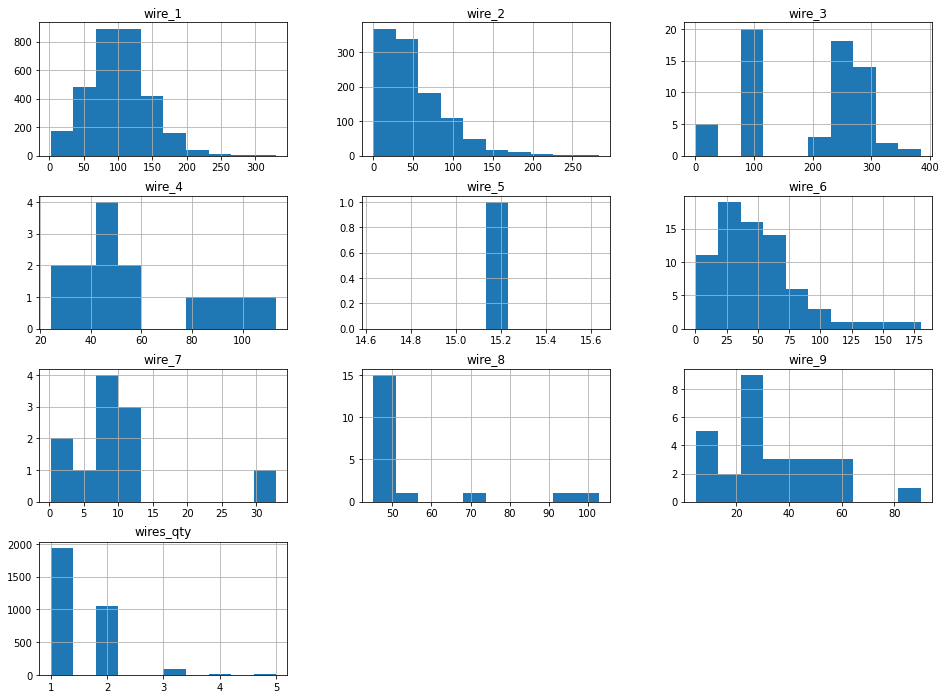

In [60]:
data_wire.drop('key', axis=1).hist(figsize=(16, 12));

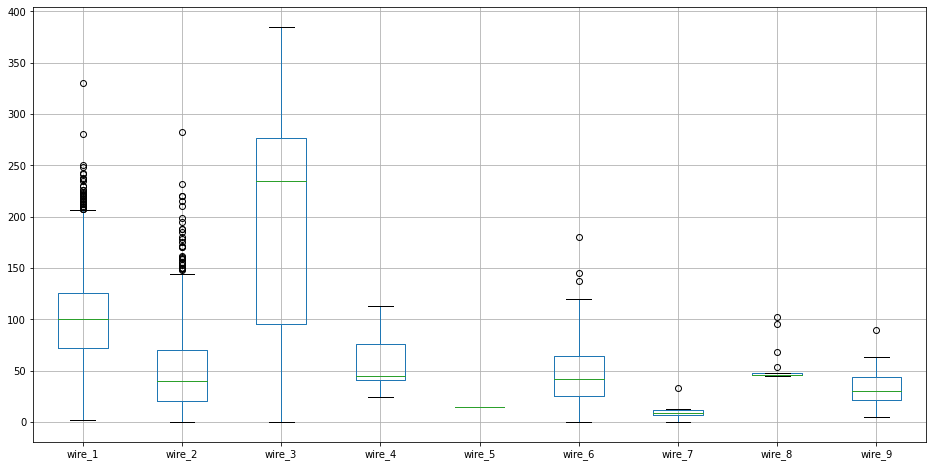

In [61]:
data_wire.drop(['key', 'wires_qty'], axis=1).boxplot(figsize=(16, 8));

В целом, похоже на правду, не наблюдается слишком резких аномальных значений, дополнительной обработки не требуется

In [62]:
data_wire_time.head()

,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
0,1,2019-05-03 11:11:41,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,2019-05-03 11:46:10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,2019-05-03 12:13:47,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,2019-05-03 12:48:05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,2019-05-03 13:18:15,2019-05-03 13:32:06,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [63]:
data_wire_time.columns = data_wire_time.columns.str.replace(' ', '_')
data_wire_time.columns = data_wire_time.columns.str.lower()

In [64]:
data_wire_time['wires_qty'] = data_wire_time.drop('key', axis=1).count(axis=1)

In [65]:
data_wire_time.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3081 entries, 0 to 3080
Data columns (total 11 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   key        3081 non-null   int64 
 1   wire_1     3055 non-null   object
 2   wire_2     1079 non-null   object
 3   wire_3     63 non-null     object
 4   wire_4     14 non-null     object
 5   wire_5     1 non-null      object
 6   wire_6     73 non-null     object
 7   wire_7     11 non-null     object
 8   wire_8     19 non-null     object
 9   wire_9     29 non-null     object
 10  wires_qty  3081 non-null   int64 
dtypes: int64(2), object(9)
memory usage: 264.9+ KB


In [66]:
def data_wire_to_datetime(data, num_of_wires):
    for i in range(1, num_of_wires + 1):
        col_name = 'wire_' + str(i)
        data[col_name] = pd.to_datetime(data[col_name], format='%Y-%m-%d %H:%M:%S', errors='ignore')
        data[col_name] = data[col_name].dt.hour

In [67]:
data_wire_time_hours = data_wire_time.copy()
data_wire_to_datetime(data_wire_time_hours, 9)

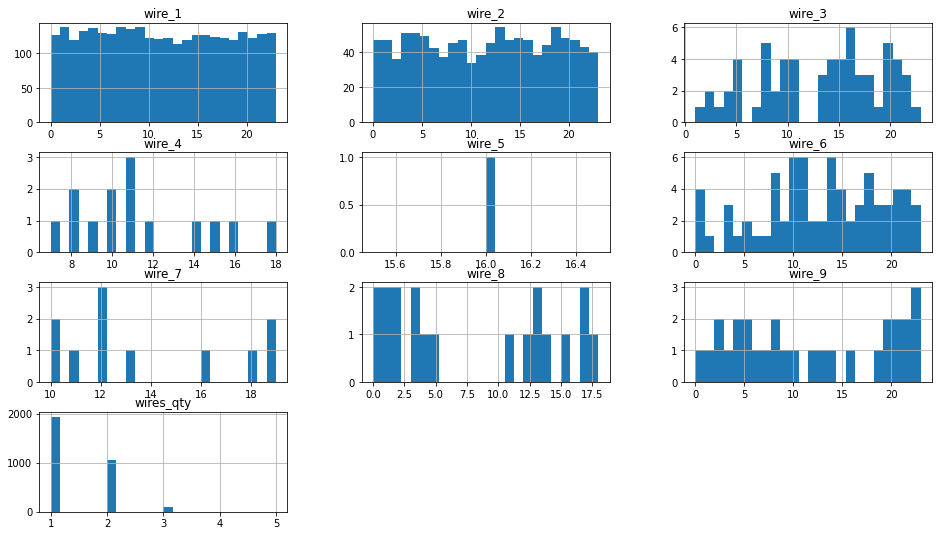

In [68]:
data_wire_time_hours.drop('key', axis=1).hist(bins=24, figsize=(16, 9));

В целом, наблюдается аналогичная ситуация, что и с подачей сыпучих материалов: одни работают на износ, другие как бюджетники.

In [69]:
#Проверяем, что количества добавлений соответствют в обеих таблицах
(data_wire['wires_qty'] - data_wire_time['wires_qty']).unique()

array([0])

## Финальнаы датасет

In [70]:
data_final = data_temp_final.drop('timestamp', axis=1)
data_final = data_final.merge(data_temp_start[['key', 'start_temperature']], on='key', how='inner')
data_final = data_final.merge(data_measurements_qty, on='key', how='inner')
data_final = data_final.merge(data_arc.groupby('key')['full_power'].sum(),\
                            on='key', how='inner')
data_final = data_final.merge(data_gas, on='key', how='inner')
data_final = data_final.merge(data_heating_iterations, on='key', how='inner')
data_final = data_final.merge(data_bulk, on='key', how='inner')
#data_final = data_final.merge(data_bulk_time_hours[['key', 'daytime']], on='key', how='inner')
#data_final = data_final.merge(data_bulk_time_months[['key', 'month']], on='key', how='inner')
data_final = data_final.merge(data_wire, on='key', how='inner')
data_final.fillna(0, inplace=True)
data_final.set_index('key', inplace=True)

Проверим данные на мультиколлинеарность

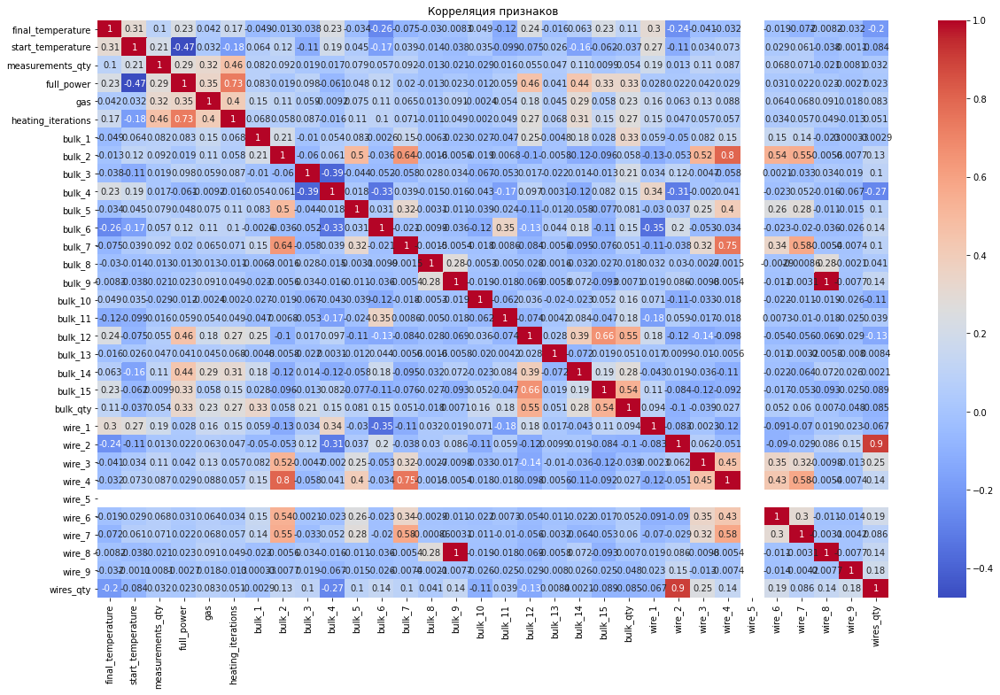

In [71]:
plt.figure(figsize=(20, 12))
plt.title('Корреляция признаков')
sns.heatmap(data_final.corr(method='spearman'), annot = True, cmap="coolwarm")
plt.show()

Наблюдается сильная линейная зависимость между признаками bulk_9 и wire_8. Возможно, при производстве одного и видов стали, в них добавляется по 1 типу сыпучих и проволочных материалов и строго соблюдаются пропорции??

In [72]:
# Удалим из финального датасета признаки 'wire_4' 'wire_5', 'wire_8' и 'wires_qty'.
data_final.drop(['wire_4', 'wire_5', 'wire_8', 'wires_qty'], axis=1, inplace=True)

In [73]:
data_final.head()

,final_temperature,start_temperature,measurements_qty,full_power,gas,heating_iterations,bulk_1,bulk_2,bulk_3,bulk_4,...,bulk_13,bulk_14,bulk_15,bulk_qty,wire_1,wire_2,wire_3,wire_6,wire_7,wire_9
key,,,,,,,,,,,,,,,,,,,,,
1,1613.0,1571.0,5,5.826395,29.749986,5,0.0,0.0,0.0,43.0,...,0.0,150.0,154.0,4,60.059998,0.00000,0.0,0.0,0.0,0.0
2,1602.0,1581.0,6,3.649216,12.555561,4,0.0,0.0,0.0,73.0,...,0.0,149.0,154.0,4,96.052315,0.00000,0.0,0.0,0.0,0.0
3,1599.0,1596.0,5,2.989534,28.554793,5,0.0,0.0,0.0,34.0,...,0.0,152.0,153.0,4,91.160157,0.00000,0.0,0.0,0.0,0.0
4,1625.0,1601.0,3,3.814962,18.841219,4,0.0,0.0,0.0,81.0,...,0.0,153.0,154.0,4,89.063515,0.00000,0.0,0.0,0.0,0.0
5,1602.0,1576.0,2,4.035758,5.413692,4,0.0,0.0,0.0,78.0,...,0.0,151.0,152.0,4,89.238236,9.11456,0.0,0.0,0.0,0.0


In [74]:
data_final.shape

(2323, 28)

In [75]:
data_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2323 entries, 1 to 2499
Data columns (total 28 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   final_temperature   2323 non-null   float64
 1   start_temperature   2323 non-null   float64
 2   measurements_qty    2323 non-null   int64  
 3   full_power          2323 non-null   float64
 4   gas                 2323 non-null   float64
 5   heating_iterations  2323 non-null   int64  
 6   bulk_1              2323 non-null   float64
 7   bulk_2              2323 non-null   float64
 8   bulk_3              2323 non-null   float64
 9   bulk_4              2323 non-null   float64
 10  bulk_5              2323 non-null   float64
 11  bulk_6              2323 non-null   float64
 12  bulk_7              2323 non-null   float64
 13  bulk_8              2323 non-null   float64
 14  bulk_9              2323 non-null   float64
 15  bulk_10             2323 non-null   float64
 16  bulk_1

In [76]:
data_final.describe()

,final_temperature,start_temperature,measurements_qty,full_power,gas,heating_iterations,bulk_1,bulk_2,bulk_3,bulk_4,...,bulk_13,bulk_14,bulk_15,bulk_qty,wire_1,wire_2,wire_3,wire_6,wire_7,wire_9
count,2323.000000,2323.000000,2323.000000,2323.000000,2323.000000,2323.000000,2323.000000,2323.000000,2323.000000,2323.000000,...,2323.000000,2323.000000,2323.000000,2323.000000,2323.000000,2323.000000,2323.000000,2323.000000,2323.000000,2323.000000
mean,1593.354714,1587.342660,4.977615,3.941070,11.353009,4.693930,3.356866,1.426173,47.196728,37.325872,...,1.070168,153.787774,120.085235,3.591907,102.473676,17.539766,3.243271,0.981348,0.006377,0.317932
std,11.204306,23.620303,1.779735,1.770690,6.245800,1.596371,11.841895,19.106620,75.160899,58.693874,...,14.253331,80.808203,84.673536,1.222656,43.493999,33.468575,27.978465,8.704381,0.205970,3.460987
min,1541.000000,1519.000000,2.000000,0.257637,0.008399,1.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1587.000000,1571.000000,4.000000,2.738132,7.285493,4.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,105.000000,0.000000,3.000000,73.291916,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1593.000000,1587.000000,5.000000,3.774493,10.100950,5.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,149.000000,107.000000,4.000000,101.119201,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1598.000000,1603.000000,6.000000,4.895969,14.217189,6.000000,0.000000,0.000000,79.500000,77.500000,...,0.000000,204.000000,204.000000,4.000000,128.080681,23.102560,0.000000,0.000000,0.000000,0.000000
max,1653.000000,1660.000000,16.000000,21.564771,60.935689,16.000000,94.000000,325.000000,454.000000,281.000000,...,305.000000,450.000000,405.000000,7.000000,330.314424,282.780152,385.008668,180.454575,8.490040,62.025600


- Финальный датасет не содержит пропусков, данные очищены от выбросов.
- Финальная датасет был проверен на мультиколлинеарность.
- В финальном датасете присутствуют только количественные признаки

## План решения задачи

1) Предобработка данных после получения уточнения по задаче и получения ответов на интересующие вопросы  
2) Анализ финального датасета. Возможно, потребуется построить сводные таблицы, добавить в датасет несколько неявных признаков.  
3) Построение модели. Обработать категориальные и количественные признаки в пайплайне, обучить линейную регрессию как точку отсчёта.  
4) Обучить различные модели с подбором параметров, сравнить и выбрать лучшую модель. Проверка модели на тестовой выборке.   
5) Подвести итоги, отчет о проекте, достигнутые результаты

In [77]:
data_final

,final_temperature,start_temperature,measurements_qty,full_power,gas,heating_iterations,bulk_1,bulk_2,bulk_3,bulk_4,...,bulk_13,bulk_14,bulk_15,bulk_qty,wire_1,wire_2,wire_3,wire_6,wire_7,wire_9
key,,,,,,,,,,,,,,,,,,,,,
1,1613.0,1571.0,5,5.826395,29.749986,5,0.0,0.0,0.0,43.0,...,0.0,150.0,154.0,4,60.059998,0.00000,0.0,0.0,0.0,0.0
2,1602.0,1581.0,6,3.649216,12.555561,4,0.0,0.0,0.0,73.0,...,0.0,149.0,154.0,4,96.052315,0.00000,0.0,0.0,0.0,0.0
3,1599.0,1596.0,5,2.989534,28.554793,5,0.0,0.0,0.0,34.0,...,0.0,152.0,153.0,4,91.160157,0.00000,0.0,0.0,0.0,0.0
4,1625.0,1601.0,3,3.814962,18.841219,4,0.0,0.0,0.0,81.0,...,0.0,153.0,154.0,4,89.063515,0.00000,0.0,0.0,0.0,0.0
5,1602.0,1576.0,2,4.035758,5.413692,4,0.0,0.0,0.0,78.0,...,0.0,151.0,152.0,4,89.238236,9.11456,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,1591.0,1570.0,3,3.986869,7.125735,4,0.0,0.0,21.0,0.0,...,0.0,129.0,223.0,5,89.150879,0.00000,0.0,0.0,0.0,0.0
2496,1591.0,1554.0,4,5.057033,9.412616,6,0.0,0.0,0.0,63.0,...,0.0,129.0,226.0,5,114.179527,0.00000,0.0,0.0,0.0,0.0
2497,1589.0,1571.0,2,2.885017,6.271699,3,0.0,0.0,0.0,85.0,...,0.0,124.0,226.0,4,94.086723,9.04800,0.0,0.0,0.0,0.0


# Построение модели

In [78]:
# Делим данные на обучающую и тестовую выборки
features = data_final.drop('final_temperature', axis=1)
target = data_final['final_temperature']
features_train, features_test, target_train, target_test = train_test_split(features, target,
                                                                            test_size=0.25,
                                                                           random_state=130323)

## Линейная модель

В качестве самой базовой модели возьмем линейную регрессию. Для повышения качества на тесте и уменьшения весов коэффициентов применим регуляризацию. Самый оптимальный способ - использовать линейную модель ElasticNet с перебором параметра регуляризации **alpha** от 0 до 5 и **l1_ratio** от 0 (модель Ridge с l2-регуляризацией) до 1 (модель Lasso с l1-регуляризацией)

In [79]:
# строим пайплайн
pipeline_elastic = make_pipeline(StandardScaler(), ElasticNet(random_state=RANDOM_STATE, max_iter=2000))

# интересующие нас параметры
param_grid_elastic = {
    'elasticnet__alpha': np.arange(0.1, 0.2, 0.01),
    'elasticnet__l1_ratio': np.arange(0.1, 1.01, 0.1)
}
# перебор параметров по нашей решетке с кросс-валидацией
gs_elastic_pl = GridSearchCV(
    pipeline_elastic,
    param_grid=param_grid_elastic,
    scoring='neg_mean_absolute_error',
    n_jobs=-1
)
#обучаем нашу модель
gs_elastic_pl.fit(features_train, target_train)

gs_elastic_best_score = gs_elastic_pl.best_score_ * -1
gs_elastic_best_params = gs_elastic_pl.best_params_

print(f'Лучшее значение MAE у модели ElasticNet на кросс-валидации равно {gs_elastic_best_score}')
print(f'Лучшие параметры {gs_elastic_best_params}')

Лучшее значение MAE у модели ElasticNet на кросс-валидации равно 6.070304982697766
Лучшие параметры {'elasticnet__alpha': 0.13, 'elasticnet__l1_ratio': 1.0}


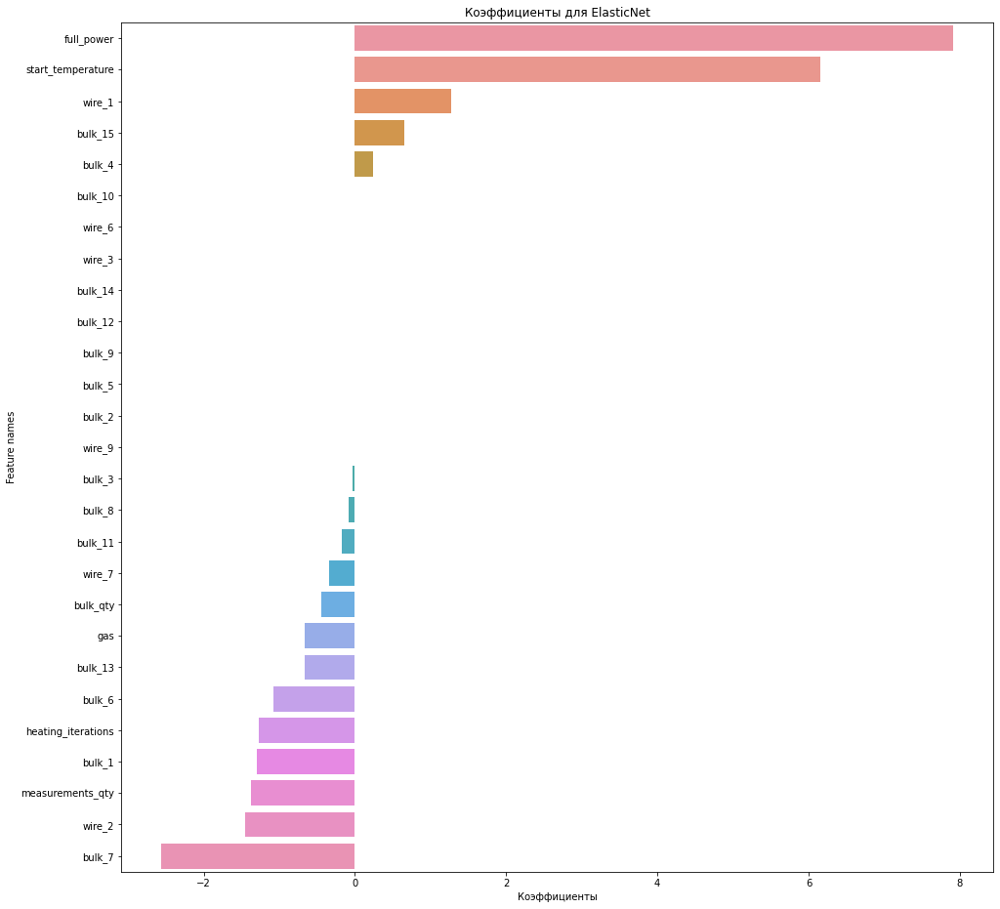

In [80]:
gs_elastic_pl.best_estimator_[1].coef_
feature_importances = pd.DataFrame({'feature_importance': gs_elastic_pl.best_estimator_[1].coef_, 
              'feature_names': features_train.columns}).sort_values(by=['feature_importance'], 
                                                           ascending=False)
plt.figure(figsize=(16,16))
sns.barplot(x='feature_importance', y='feature_names', data=feature_importances);
plt.title('Коэффициенты для ElasticNet')
plt.xlabel('Коэффициенты')
plt.ylabel('Feature names');

Качество на кросс-валидации модели ElasticNet нас устраивает. Однако, проверим и другие модели. В качестве более "продвинутой" попробуем RandomForestRegressor

На основании работы ElasticNet можно попробовать избавиться от признаков при нулевых коэффициентах, т.к. они не оказывают какое-либо влияние на модель и только расходуют вычислительные мощности.

In [81]:
columns_to_drop = ['bulk_10', 'wire_6', 'wire_3', 'bulk_14', 'bulk_12', 'bulk_9', 'bulk_5', 'bulk_2', 'wire_9']

In [82]:
features_train.drop(columns_to_drop, axis=1, inplace=True)

In [83]:
features_test.drop(columns_to_drop, axis=1, inplace=True)

## Случайный лес

Чтобы выжать максимум из случайного леса и снизить время применим метод главных компонент, а затем, получившуюся выборку прогоним через RandomizedSearchCV и GridSearchCV с подбором параметров числа деревьев, числа признаков для выбора расщепления, максимальной глубины дерева, минимальное число объектов для расщепления узла, минимальное число объектов в листьях.

Для начала применим метод главных компонент для снижения размерности пространства признаков и попробуем снизить объем вычислительных ресурсов. Попробуем понять, какие признаки объясняют большую часть дисперсии в данных.

In [84]:
scaler = StandardScaler()
features_train_scaled = scaler.fit_transform(features_train)

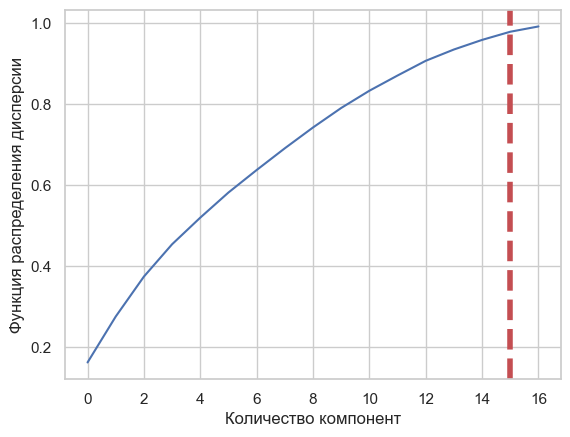

None

,Cumulative Variance Ratio,Explained Variance Ratio
0,0.162224,0.162224
1,0.275522,0.113299
2,0.374046,0.098523
3,0.453761,0.079715
4,0.519434,0.065673
5,0.581403,0.061970
6,0.636838,0.055434
7,0.690483,0.053645
8,0.741813,0.051330
9,0.789932,0.048119


In [85]:
pca_test = PCA(n_components=17)
pca_test.fit(features_train_scaled)
sns.set(style='whitegrid')
plt.plot(np.cumsum(pca_test.explained_variance_ratio_))
plt.xlabel('Количество компонент')
plt.ylabel('Функция распределения дисперсии')
plt.axvline(linewidth=4, color='r', linestyle = '--', x=15, ymin=0, ymax=1)
display(plt.show())
evr = pca_test.explained_variance_ratio_
cvr = np.cumsum(pca_test.explained_variance_ratio_)
pca_df = pd.DataFrame()
pca_df['Cumulative Variance Ratio'] = cvr
pca_df['Explained Variance Ratio'] = evr
display(pca_df.head(23))

 Как видно из графика и таблицы выше, метод главных компонент не дал ожидаемого результата. Исходя из этого, можно не понижать размерность пространства признаков и переходить сразу к оптимизации гиперпараметров с использованием  RandomizedSearchCV на первом этапе, т.к. он работает значительно быстрее и GridSearchCV на последнем, куда мы передадим уже  урезаный набор гиперпараметров.

In [86]:
%%time
model_rf = RandomForestRegressor(random_state=RANDOM_STATE)

pipeline_rf = make_pipeline(StandardScaler(), model_rf)

param_grid_rf = {
    'randomforestregressor__n_estimators': [int(x) for x in np.linspace(start = 100, stop = 1000, num = 10)],
    'randomforestregressor__max_features': ['log2', 'sqrt'],
    'randomforestregressor__max_depth': [int(x) for x in np.linspace(start = 1, stop = 20, num = 15)],
    'randomforestregressor__min_samples_split': [int(x) for x in np.linspace(start = 2, stop = 50, num = 10)],
    'randomforestregressor__min_samples_leaf': [int(x) for x in np.linspace(start = 2, stop = 50, num = 10)],
    'randomforestregressor__bootstrap': [True, False]
}
rs_rf_pl = RandomizedSearchCV(
    pipeline_rf,
    param_distributions=param_grid_rf,
    scoring='neg_mean_absolute_error',
    n_jobs=-1,
    random_state=RANDOM_STATE)

rs_rf_pl.fit(features_train, target_train)

rs_rf_pl_best_score = rs_rf_pl.best_score_ * -1
rs_rf_pl_best_params = rs_rf_pl.best_params_
print(f'Лучшее значение MAE у модели Random Forest на кросс-валидации равно {rs_rf_pl_best_score}')
print(f'Лучшие параметры {rs_rf_pl_best_params}')

Лучшее значение MAE у модели Random Forest на кросс-валидации равно 6.5437175261274
Лучшие параметры {'randomforestregressor__n_estimators': 400, 'randomforestregressor__min_samples_split': 50, 'randomforestregressor__min_samples_leaf': 7, 'randomforestregressor__max_features': 'sqrt', 'randomforestregressor__max_depth': 13, 'randomforestregressor__bootstrap': False}
Wall time: 17.1 s


Построим датафрейм и столбчатые графики по результатам работы RandomizedSearchCV

In [87]:
rs_df = pd.DataFrame(rs_rf_pl.cv_results_)
rs_df['mean_test_score'] = rs_df['mean_test_score'] * -1
rs_df = rs_df.sort_values('rank_test_score').reset_index(drop=True)
rs_df = rs_df.drop([
            'mean_fit_time', 
            'std_fit_time', 
            'mean_score_time',
            'std_score_time', 
            'params', 
            'split0_test_score', 
            'split1_test_score', 
            'split2_test_score', 
            'std_test_score'],
            axis=1)
rs_df.head(10)

,param_randomforestregressor__n_estimators,param_randomforestregressor__min_samples_split,param_randomforestregressor__min_samples_leaf,param_randomforestregressor__max_features,param_randomforestregressor__max_depth,param_randomforestregressor__bootstrap,split3_test_score,split4_test_score,mean_test_score,rank_test_score
0,400,50,7,sqrt,13,False,-6.412088,-7.112299,6.543718,1
1,400,23,18,sqrt,18,False,-6.442729,-7.206444,6.605765,2
2,800,23,18,sqrt,18,True,-6.480551,-7.304965,6.703537,3
3,700,39,2,log2,5,False,-6.630019,-7.326660,6.789028,4
4,100,28,23,sqrt,7,True,-6.610146,-7.355233,6.798390,5
5,100,28,28,log2,20,True,-6.631606,-7.406292,6.836050,6
6,500,18,39,sqrt,9,False,-6.693662,-7.453469,6.866606,7
7,900,44,39,log2,13,True,-6.759312,-7.567271,6.960447,8
8,700,28,34,log2,3,False,-7.128066,-7.771382,7.221633,9
9,700,44,2,sqrt,1,True,-7.703105,-8.196966,7.763346,10


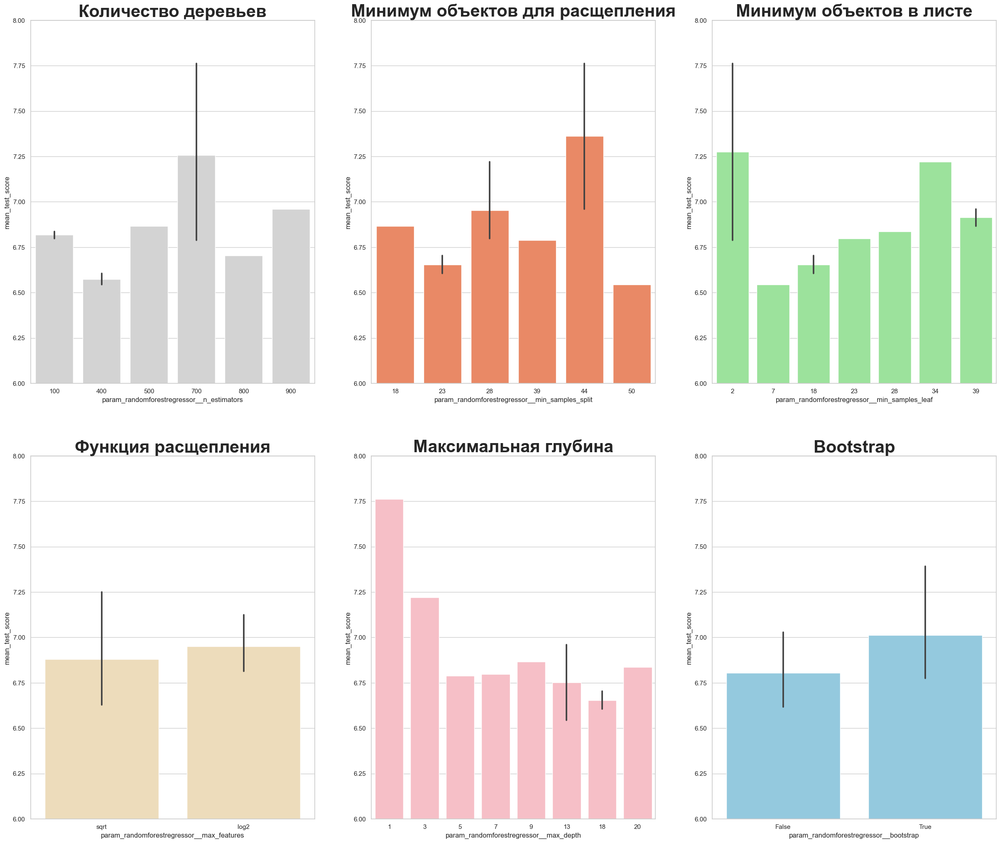

In [88]:
fig, axs = plt.subplots(ncols=3, nrows=2)
sns.set(style="whitegrid", color_codes=True, font_scale = 2)
fig.set_size_inches(30,25)
sns.barplot(x='param_randomforestregressor__n_estimators', y='mean_test_score', data=rs_df, ax=axs[0,0], color='lightgrey')
axs[0,0].set_ylim([6, 8])
axs[0,0].set_title(label = 'Количество деревьев', size=30, weight='bold')
sns.barplot(x='param_randomforestregressor__min_samples_split', y='mean_test_score', data=rs_df, ax=axs[0,1], color='coral')
axs[0,1].set_ylim([6, 8])
axs[0,1].set_title(label = 'Минимум объектов для расщепления', size=30, weight='bold')
sns.barplot(x='param_randomforestregressor__min_samples_leaf', y='mean_test_score', data=rs_df, ax=axs[0,2], color='lightgreen')
axs[0,2].set_ylim([6, 8])
axs[0,2].set_title(label = 'Минимум объектов в листе', size=30, weight='bold')
sns.barplot(x='param_randomforestregressor__max_features', y='mean_test_score', data=rs_df, ax=axs[1,0], color='wheat')
axs[1,0].set_ylim([6, 8])
axs[1,0].set_title(label = 'Функция расщепления', size=30, weight='bold')
sns.barplot(x='param_randomforestregressor__max_depth', y='mean_test_score', data=rs_df, ax=axs[1,1], color='lightpink')
axs[1,1].set_ylim([6, 8])
axs[1,1].set_title(label = 'Максимальная глубина', size=30, weight='bold')
sns.barplot(x='param_randomforestregressor__bootstrap',y='mean_test_score', data=rs_df, ax=axs[1,2], color='skyblue')
axs[1,2].set_ylim([6, 8])
axs[1,2].set_title(label = 'Bootstrap', size=30, weight='bold')
plt.show()

На основании графиков выше можно сузить количество диапазон гиперпараметров и уже их передать в в GridSearch.

In [89]:
%%time
param_grid_rf = {
    'randomforestregressor__n_estimators': [400, 800],
    'randomforestregressor__max_features': ['sqrt'],
    'randomforestregressor__max_depth': [15, 17, 18, 19],
    'randomforestregressor__min_samples_split': [23, 50, 52, 54],
    'randomforestregressor__min_samples_leaf': [4, 5, 6, 7],
    'randomforestregressor__bootstrap': [False]
}
gs_rf_pl = GridSearchCV(
    pipeline_rf,
    param_grid=param_grid_rf,
    scoring='neg_mean_absolute_error',
    n_jobs=-1,
    )
gs_rf_pl.fit(features_train, target_train)

gs_rf_pl_best_score = gs_rf_pl.best_score_ * -1
gs_rf_pl_best_params = gs_rf_pl.best_params_
print(f'Лучшее значение MAE у модели Random Forest после оптимизации на кросс-валидации равно {gs_rf_pl_best_score}')
print(f'Лучшие параметры после оптимизации {gs_rf_pl_best_params}')

Лучшее значение MAE у модели Random Forest после оптимизации на кросс-валидации равно 6.28584587978292
Лучшие параметры после оптимизации {'randomforestregressor__bootstrap': False, 'randomforestregressor__max_depth': 18, 'randomforestregressor__max_features': 'sqrt', 'randomforestregressor__min_samples_leaf': 4, 'randomforestregressor__min_samples_split': 23, 'randomforestregressor__n_estimators': 400}
Wall time: 4min 31s


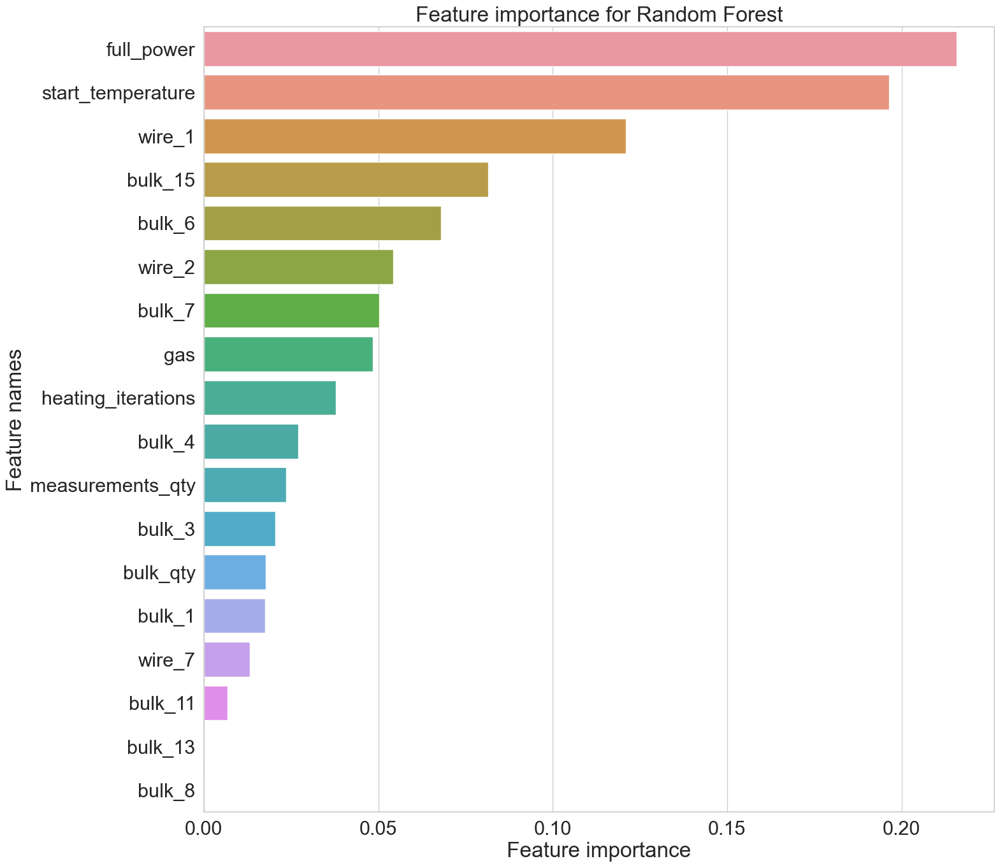

In [90]:
feature_importances = pd.DataFrame({'feature_importance': gs_rf_pl.best_estimator_[1].feature_importances_, 
              'feature_names': features_train.columns}).sort_values(by=['feature_importance'], 
                                                           ascending=False)
plt.figure(figsize=(16,16))
sns.barplot(x='feature_importance', y='feature_names', data=feature_importances);
plt.title('Feature importance for Random Forest')
plt.xlabel('Feature importance')
plt.ylabel('Feature names');

## Градиентный бустинг

In [91]:
%%time
# Создадим пул и переберем несколько гиперпараметров: скорость спуска, глубина дерева 
# и коэффициент при члене регуляризации функции потерь

catboost_dataset = Pool(data=features_train,
                       label=target_train)
model_cat = CatBoostRegressor(random_state=RANDOM_STATE, loss_function='MAE')

param_grid = {
     'iterations': [1500],
     'learning_rate': [0.05, 0.1, 0.15, 0.16, 0.17],
     'depth': [2, 3, 4],
     'l2_leaf_reg': [3, 4, 5, 6]}

gs_cb = model_cat.grid_search(param_grid, catboost_dataset, cv=5, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 1513.8510746	test: 1513.9252127	best: 1513.9252127 (0)	total: 146ms	remaining: 3m 39s
1:	learn: 1438.1813940	test: 1438.2547685	best: 1438.2547685 (1)	total: 147ms	remaining: 1m 50s
2:	learn: 1366.2928358	test: 1366.3669845	best: 1366.3669845 (2)	total: 148ms	remaining: 1m 13s
3:	learn: 1298.0314940	test: 1298.0956939	best: 1298.0956939 (3)	total: 148ms	remaining: 55.5s
4:	learn: 1233.1691946	test: 1233.2290618	best: 1233.2290618 (4)	total: 149ms	remaining: 44.5s
5:	learn: 1171.5557057	test: 1171.6319553	best: 1171.6319553 (5)	total: 149ms	remaining: 37.2s
6:	learn: 1113.0221577	test: 1113.0924628	best: 1113.0924628 (6)	total: 150ms	remaining: 32s
7:	learn: 1057.4248479	test: 1057.4886709	best: 1057.4886709 (7)	total: 151ms	remaining: 28.1s
8:	learn: 1004.6000216	test: 1004.6589123	best: 1004.6589123 (8)	total: 151ms	remaining: 25.1s
9:	learn: 954.4124048	test: 954.4676478	best: 954.4676478 (9)	total: 152ms	remaining: 22.6s
10:	learn: 906.7436054	test: 906.7993238	best: 906.7

Text(0, 0.5, 'Feature names')

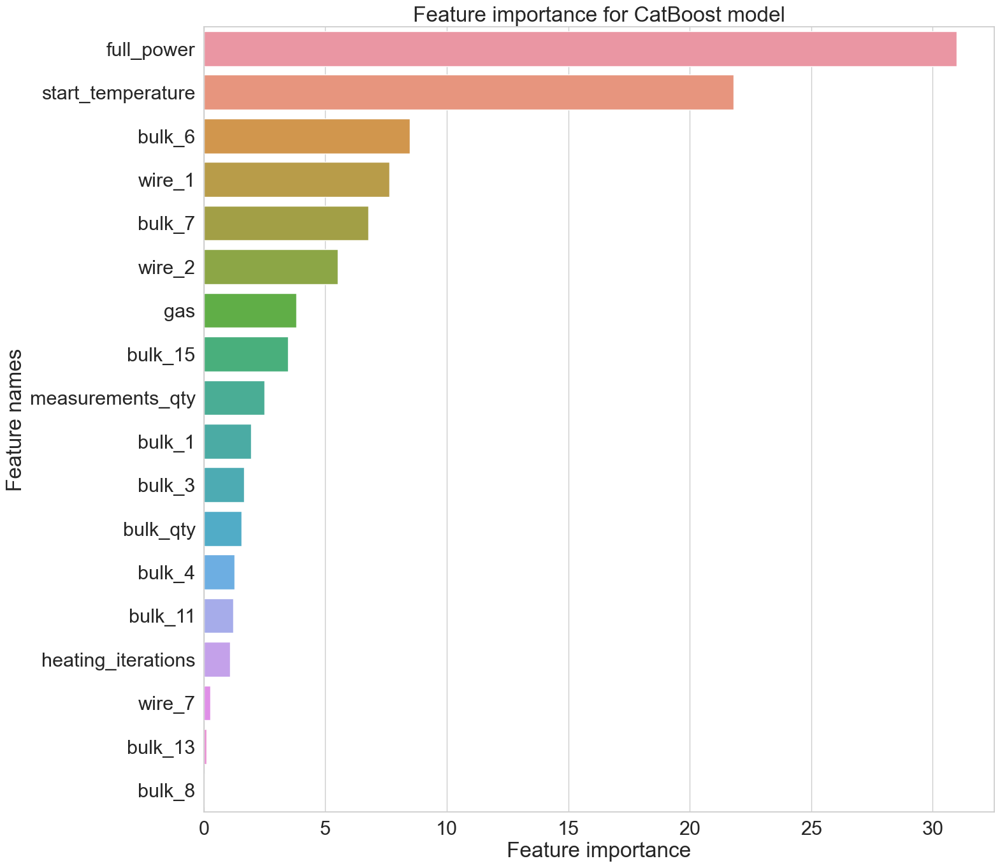

In [92]:
feature_importances = pd.DataFrame({'feature_importance': model_cat.get_feature_importance(catboost_dataset), 
              'feature_names': features_train.columns}).sort_values(by=['feature_importance'], 
                                                           ascending=False)
plt.figure(figsize=(16,16))
sns.barplot(x='feature_importance', y='feature_names', data=feature_importances);
plt.title('Feature importance for CatBoost model')
plt.xlabel('Feature importance')
plt.ylabel('Feature names')

Градиентный бустинг CatBoost показал лучшие результаты по результатам кросс-валидации с перебором гиперпараметров.
Метрика MAE на валидации показала значение 5.28 против 6.07 у линейной регрессии и 6.29 у случайного леса. Признаки, вносящие наибольший вклад в предсказание во всех трёх моделях - полная мощность и начальная температура.
Считаем, что мы нашли наиболее подходящую модель, протестируем её на тестовых данных.

In [93]:
predictions = model_cat.predict(features_test)
mae = mean_absolute_error(predictions, target_test)
print(f'Средняя абсолютная ошибка не тестовой выборке равна {mae}')

Средняя абсолютная ошибка не тестовой выборке равна 6.008317908298884


Задача по подбору и тестированию лучшей модели выполнена успешно, метрика MAE на тестовых данных не превышает установленные границы. 

# Отчет о проделанной работе

## Задание на моделирование

Сталелитейный комбинат испытывает необходимость в оптимизации затрат на производство; одиним из основных факторов выступает энергопотребление, напрямую зависящее от температуры нагрева стали.  
**Задача на моделирование: предсказание температуры розлива стали (последний замер).**  
На входе были получены несколько таблиц с данными, сгруппированными по партиям:
- `data_arc.csv` — данные об электродах;
- `data_bulk.csv` — данные о подаче сыпучих материалов (объём);
- `data_bulk_time.csv` *—* данные о подаче сыпучих материалов (время);
- `data_gas.csv` — данные о продувке сплава газом;
- `data_temp.csv` — результаты измерения температуры;
- `data_wire.csv` — данные о проволочных материалах (объём);
- `data_wire_time.csv` — данные о проволочных материалах (время).
Объект моделирования - котёл.

## Этапы решения задания

Полученные датасеты были проанализированы и подготовлены для моделирования:  
- все значения были проверены на "адекватность", построены гистограмы и диаграмы размаха.
- аномальные значения были удалены\обработаны
- добыты новые признаки, используемые для построения модели
- на основании анализа были даны рекомендации по оптимизации
- исключены данные для которых отсутствовал целевой признак

На основании подготовленных таблиц был сформирован финальный датасет, используемый для моделирования. Признаки использованные при моделировании:
- Начальная температура (1-й замер)
- Количество измерений температуры по партиям
- Полная мощность
- Данные о продувке газом
- Количество итераций нагрева
- Данные о добавленных объемах сыпучих смесей
- Данные о добавленных объемах проволочных материалов
- Данные о количестве итераций внесения добавок по партиям

Были обучены три модели машинного обучения: линейная регрессия с нормализацией признаков, случайные лес и модель градиентного бустинга.  
В процессе моделирования ещё часть данных со значениями объемов насыпных и проволочных материалов до были исключены, т.к. не влияли на целевую переменную.  
По итогу, все три модели показали неплохой, удовлетворяющий условию задачи результат, однако лучшей оказалась модель градиентного бустинга CatBoost.  
Метрика качества на тестовых данных - среднее абсолютное отклонение - **6.01** при параметрах модели:
- скорость обучения 0.16
- глубина дерева 2
- коэффициент при члене регуляризации функции потерь 5
- количество итераций 1500
- random_state 130323

После анализа результатов работы модели, были выявлены факторы, вносящие наибольший вклад в значение финальной температуры:
- Начальная температура (1-й замер)
- Полная мощность (квадратный корень из суммы квадратов активной и реактивной мощностей)

По результатам моделирования даны дополнительные рекомендации по более глубокому анализу для дальнейшей оптимизации энергоресурсов:
- определение нормальных границ колебания температур
- фиксация отклонений температур от заданных рамок
- сбор и анализ данных по производству для подобных отклонений
- анализ первопричин и проверка гипотех
- разработка энергосберегающий мероприятий

Все этапы от получения данных до проверки модели на тесте были выполнены в полном объеме, задача на моделирование достигнута.